In [2]:
import sys
from collections import Counter
from pathlib import Path

import PIL
import torch
import torchvision
import ultralytics
from IPython.display import Video
from PIL import Image
from torchvision import transforms
from torchvision.io import read_image
from torchvision.utils import make_grid
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\hp\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
yolo = YOLO(task="detect", model="yolov8s.pt")

In [4]:
yolo.names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

In [5]:
yolo.names[5]

'bus'

In [6]:
class_assigned_to_23 = ...
print(f"{class_assigned_to_23} corresponds to 23")

Ellipsis corresponds to 23


In [7]:
class_assigned_to_23 = yolo.names[23]
print(f"{class_assigned_to_23} corresponds to 23")

giraffe corresponds to 23


In [8]:
classes_not_in_yolo = [
    "ambulance",
    "army vehicle",
    "auto rickshaw",
    "garbagevan",
    "human hauler",
    "minibus",
    "minivan",
    "pickup",
    "policecar",
    "rickshaw",
    "scooter",
    "suv",
    "taxi",
    "three wheelers (CNG)",
    "van",
    "wheelbarrow",
]

In [9]:
"ambulance" not in yolo.names.values()

True

In [10]:
is_army_vehicle_inlcuded = "army vechile" not in yolo.names.values()
print(is_army_vehicle_inlcuded)

True


In [11]:
data_dir = Path("data_video", "extracted_frames")
image_path = data_dir / "frame_1050.jpg"

result = yolo(image_path)


image 1/1 d:\Projects\Traffic Monitoring in Dhaka using Deep learning\data_video\extracted_frames\frame_1050.jpg: 384x640 2 persons, 1 bicycle, 8 cars, 2 buss, 339.5ms
Speed: 23.4ms preprocess, 339.5ms inference, 53.2ms postprocess per image at shape (1, 3, 384, 640)


In [12]:
print(f"Type of result: {type(result)}")
print(f"Length of result: {len(result)}")

Type of result: <class 'list'>
Length of result: 1


In [13]:
image_path_task = data_dir / "frame_2575.jpg"
result_task = yolo(image_path_task)

print(type(result_task))



image 1/1 d:\Projects\Traffic Monitoring in Dhaka using Deep learning\data_video\extracted_frames\frame_2575.jpg: 384x640 13 persons, 11 cars, 1 motorcycle, 1 truck, 1 backpack, 201.7ms
Speed: 2.6ms preprocess, 201.7ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)
<class 'list'>


In [15]:
result = yolo.predict(image_path, conf=0.5, save=True, save_txt=True)


image 1/1 d:\Projects\Traffic Monitoring in Dhaka using Deep learning\data_video\extracted_frames\frame_1050.jpg: 384x640 1 person, 1 bicycle, 3 cars, 2 buss, 194.0ms
Speed: 1.8ms preprocess, 194.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to C:\Users\hp\runs\detect\predict
1 label saved to C:\Users\hp\runs\detect\predict\labels


In [17]:
result_task = yolo.predict(image_path_task, conf=0.5, save=True, save_txt=True)


image 1/1 d:\Projects\Traffic Monitoring in Dhaka using Deep learning\data_video\extracted_frames\frame_2575.jpg: 384x640 2 persons, 6 cars, 1 motorcycle, 192.1ms
Speed: 3.1ms preprocess, 192.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to C:\Users\hp\runs\detect\predict
2 labels saved to C:\Users\hp\runs\detect\predict\labels


In [18]:
result[0]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant',

In [19]:
result[0].boxes

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 2., 2., 1., 5., 5., 0.])
conf: tensor([0.9039, 0.8548, 0.8375, 0.8323, 0.8061, 0.6084, 0.5534])
data: tensor([[4.3695e+02, 1.6984e+02, 5.4202e+02, 2.3865e+02, 9.0395e-01, 2.0000e+00],
        [1.5662e+02, 1.5208e+02, 3.2427e+02, 2.5230e+02, 8.5477e-01, 2.0000e+00],
        [5.3971e+02, 1.8355e+02, 6.1373e+02, 2.3000e+02, 8.3751e-01, 2.0000e+00],
        [2.7851e+02, 1.7785e+02, 4.4652e+02, 2.9214e+02, 8.3232e-01, 1.0000e+00],
        [4.6189e-01, 1.0103e+01, 7.6920e+01, 2.1562e+02, 8.0605e-01, 5.0000e+00],
        [5.4849e+02, 1.3676e+02, 6.1407e+02, 1.8558e+02, 6.0838e-01, 5.0000e+00],
        [3.1102e+02, 1.0355e+02, 3.7114e+02, 2.5445e+02, 5.5339e-01, 0.0000e+00]])
id: None
is_track: False
orig_shape: (360, 640)
shape: torch.Size([7, 6])
xywh: tensor([[489.4863, 204.2482, 105.0627,  68.8101],
        [240.4418, 202.1921, 167.6510, 100.2223],
        [576.7197, 206.7732,  74.0134,  46.4463],
        [362.5140,

In [21]:
print(result[0].boxes.cls)
print(f"Number of objects detected: {len(result[0].boxes.cls)}")

tensor([2., 2., 2., 1., 5., 5., 0.])
Number of objects detected: 7


In [23]:
number_of_detected_objs = len(result_task[0].boxes.cls)
print(f"Number of objects detected in frame_2575.jpg: {number_of_detected_objs}")

Number of objects detected in frame_2575.jpg: 9


In [24]:
object_counts = Counter([yolo.names[int(cls)] for cls in result[0].boxes.cls])
object_counts

Counter({'car': 3, 'bus': 2, 'bicycle': 1, 'person': 1})

In [25]:
object_counts_task = Counter(
    [yolo.names[int(cls)] for cls in result_task[0].boxes.cls]
)

most_common_class, count_of_class = object_counts_task.most_common(n=1)[0]
print(f"Most common class: {most_common_class}")
print(f"Number of detected {most_common_class}: {count_of_class}")

Most common class: car
Number of detected car: 6


In [26]:
print(result[0].boxes.conf)
print(f"Number of objects detected: {len(result[0].boxes.conf)}")

tensor([0.9039, 0.8548, 0.8375, 0.8323, 0.8061, 0.6084, 0.5534])
Number of objects detected: 7


In [27]:
length_of_confidence_tensor = len(result_task[0].boxes.conf)
print(f"Number of objects detected: {length_of_confidence_tensor}")

Number of objects detected: 9


In [28]:
number_of_confident_objects = (result[0].boxes.conf > 0.75).sum().item()
print(f"Number of objects detected with 50% confidence: {number_of_confident_objects}")

Number of objects detected with 50% confidence: 5


In [30]:
number_of_confident_objects_task = (result_task[0].boxes.conf > 0.75).sum().item()

print(
    f"Number of objects detected in frame_2575.jpg with 50% confidence: {number_of_confident_objects_task}"
)

Number of objects detected in frame_2575.jpg with 50% confidence: 5


In [31]:
result[0].boxes.xywh

tensor([[489.4863, 204.2482, 105.0627,  68.8101],
        [240.4418, 202.1921, 167.6510, 100.2223],
        [576.7197, 206.7732,  74.0134,  46.4463],
        [362.5140, 234.9969, 168.0120, 114.2923],
        [ 38.6910, 112.8627,  76.4582, 205.5199],
        [581.2806, 161.1671,  65.5864,  48.8183],
        [341.0811, 179.0009,  60.1201, 150.9053]])

In [32]:
result[0].orig_shape

(360, 640)

In [33]:
result[0].boxes.xywhn[0]

tensor([0.7648, 0.5674, 0.1642, 0.1911])

In [35]:
result[0].boxes.xywh[0] / torch.Tensor([640, 360, 640, 360]).to("cpu")

tensor([0.7648, 0.5674, 0.1642, 0.1911])

In [36]:
original_shape_task = result_task[0].orig_shape
print(f"Original shape of frame_2574.jpg: {original_shape_task}")

Original shape of frame_2574.jpg: (360, 640)


In [37]:
normalized_xywh = result_task[0].boxes.xywhn
print(f"Normalized xywh bounding box for frame_2575.jpg: {normalized_xywh[0]}")

Normalized xywh bounding box for frame_2575.jpg: tensor([0.4132, 0.6954, 0.4033, 0.5825])


In [38]:
normalized_xywh_task = (
    result_task[0].boxes.xywh[0] / torch.Tensor([640, 360, 640, 360]).to("cpu")
)
print(f"Normalized xywh bounding box for frame_2575.jpg: {normalized_xywh[0]}")

Normalized xywh bounding box for frame_2575.jpg: tensor([0.4132, 0.6954, 0.4033, 0.5825])


In [39]:
result[0].boxes.xyxy

tensor([[4.3695e+02, 1.6984e+02, 5.4202e+02, 2.3865e+02],
        [1.5662e+02, 1.5208e+02, 3.2427e+02, 2.5230e+02],
        [5.3971e+02, 1.8355e+02, 6.1373e+02, 2.3000e+02],
        [2.7851e+02, 1.7785e+02, 4.4652e+02, 2.9214e+02],
        [4.6189e-01, 1.0103e+01, 7.6920e+01, 2.1562e+02],
        [5.4849e+02, 1.3676e+02, 6.1407e+02, 1.8558e+02],
        [3.1102e+02, 1.0355e+02, 3.7114e+02, 2.5445e+02]])

In [40]:
result[0].boxes.xyxyn

tensor([[6.8274e-01, 4.7179e-01, 8.4690e-01, 6.6293e-01],
        [2.4471e-01, 4.2245e-01, 5.0667e-01, 7.0084e-01],
        [8.4330e-01, 5.0986e-01, 9.5895e-01, 6.3888e-01],
        [4.3517e-01, 4.9403e-01, 6.9769e-01, 8.1151e-01],
        [7.2170e-04, 2.8063e-02, 1.2019e-01, 5.9895e-01],
        [8.5701e-01, 3.7988e-01, 9.5949e-01, 5.1549e-01],
        [4.8597e-01, 2.8763e-01, 5.7991e-01, 7.0682e-01]])

In [41]:
location_of_results = Path(result[0].save_dir)

print(f"Results saved to {location_of_results}")
location_of_results.exists()

Results saved to C:\Users\hp\runs\detect\predict


True

In [42]:
location_of_results_task = result_task[0].save_dir
print(f"Results for frame_2575.jpg saved to {location_of_results_task}")

Results for frame_2575.jpg saved to C:\Users\hp\runs\detect\predict


In [43]:
result[0].speed

{'preprocess': 1.7699999998512794,
 'inference': 194.00690000020404,
 'postprocess': 1.8867999997382867}

In [44]:
print(f"Total time in milliseconds: {sum(result[0].speed.values())}")

Total time in milliseconds: 197.6636999997936


In [46]:
total_time = result_task[0].speed.values()
print(f"Total time in milliseconds: {total_time}")

Total time in milliseconds: dict_values([3.148699999655946, 192.12819999984276, 1.7223999998350337])


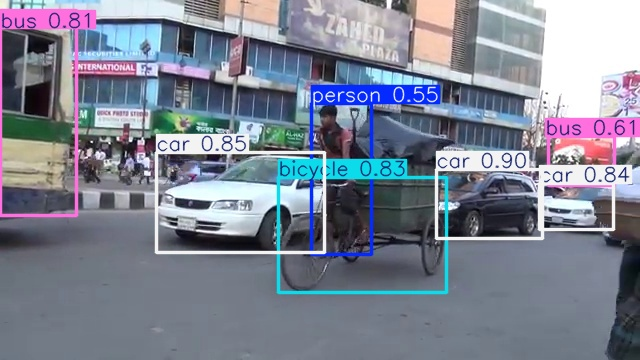

In [47]:
Image.open(location_of_results / "frame_1050.jpg")

In [50]:
location_of_results_task

'C:\\Users\\hp\\runs\\detect\\predict'

In [52]:
data_dir

WindowsPath('data_video/extracted_frames')

In [53]:
Path(location_of_results_task)

WindowsPath('C:/Users/hp/runs/detect/predict')

In [54]:
location_of_results_task = Path(location_of_results_task)

In [55]:
location_of_results_task

WindowsPath('C:/Users/hp/runs/detect/predict')

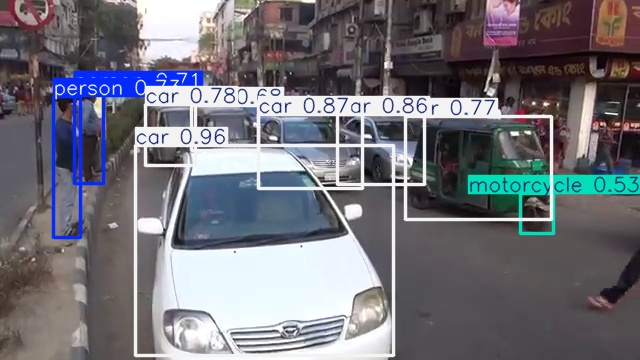

In [56]:
# Display image frame_2575.jpg with the bounding boxes
Image.open(location_of_results_task / "frame_2575.jpg")

In [57]:
with (location_of_results / "labels" / "frame_1050.txt").open("r") as f:
    print(f.read())

2 0.764822 0.567356 0.16416 0.191139
2 0.37569 0.561645 0.261955 0.278395
2 0.901125 0.57437 0.115646 0.129017
1 0.566428 0.652769 0.262519 0.317479
5 0.0604546 0.313508 0.119466 0.570889
5 0.908251 0.447686 0.102479 0.135606
0 0.532939 0.497225 0.0939376 0.419181



In [60]:
with (location_of_results_task / "labels" / "frame_2575.txt").open("r") as f:
    print(f.read())

2 0.413234 0.695446 0.403302 0.58246
2 0.484847 0.421423 0.163283 0.204253
2 0.595295 0.414594 0.135674 0.193444
2 0.266838 0.373886 0.0775616 0.169089
2 0.74819 0.466358 0.227984 0.285972
0 0.104577 0.463135 0.0432231 0.39213
0 0.139043 0.379178 0.0446077 0.262667
2 0.351648 0.354532 0.105288 0.124523
3 0.838957 0.592829 0.0514652 0.112449



In [61]:
def display_sample_images(dir_path, sample=5):
    dir_path = Path(dir_path) if isinstance(dir_path, str) else dir_path

    image_list = []
    # Sort the images to ensure they are processed in order
    images = sorted(dir_path.glob("*.jpg"))
    if not images:
        return None

    # Iterate over the first 'sample' images
    for img_path in images[:sample]:
        img = read_image(str(img_path))
        resize_transform = transforms.Resize((240, 240))
        img = resize_transform(img)
        image_list.append(img)

    # Organize the grid to have 'sample' images per row
    Grid = make_grid(image_list, nrow=5)
    # Convert the tensor grid to a PIL Image for display
    img = torchvision.transforms.ToPILImage()(Grid)
    return img

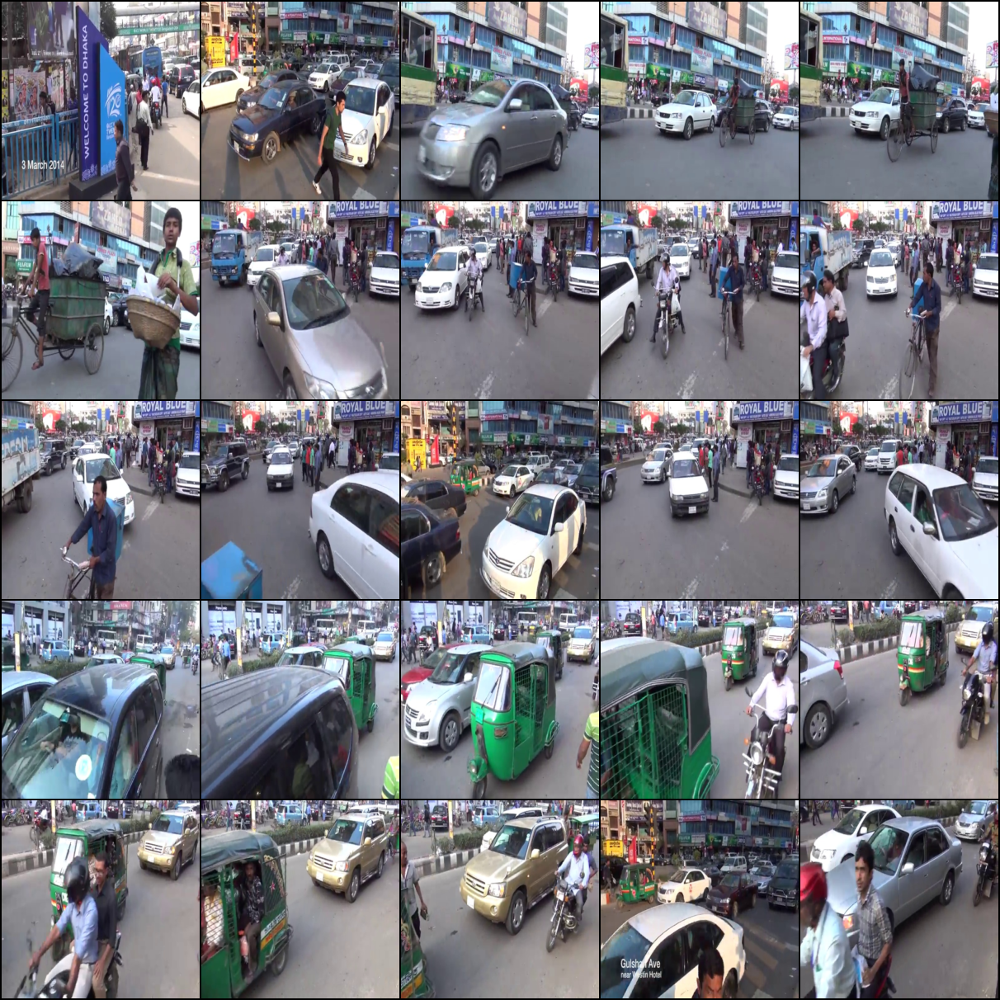

In [62]:
display_sample_images(data_dir, sample=25)

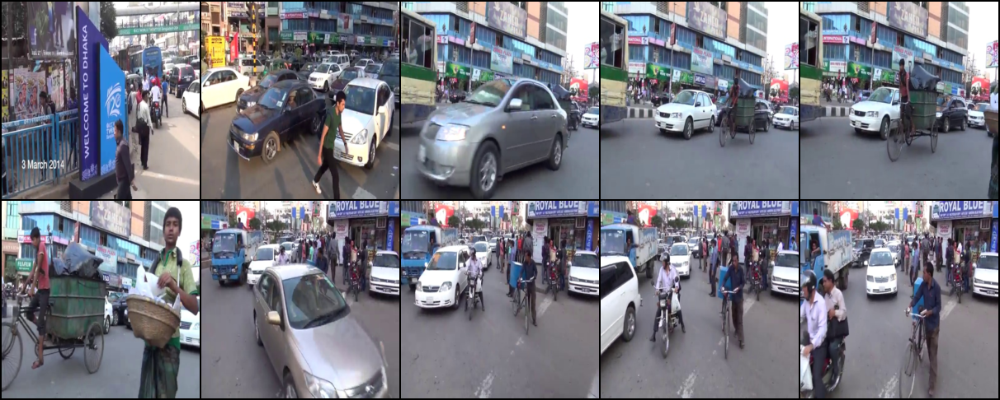

In [64]:
# Display the first ten images
display_sample_images(data_dir, sample = 10)

In [65]:
images_path = list(data_dir.iterdir())[:25]
images_path

[WindowsPath('data_video/extracted_frames/frame_0.jpg'),
 WindowsPath('data_video/extracted_frames/frame_100.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1000.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1025.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1050.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1075.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1100.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1125.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1150.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1175.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1200.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1225.jpg'),
 WindowsPath('data_video/extracted_frames/frame_125.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1250.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1275.jpg'),
 WindowsPath('data_video/extracted_frames/frame_1300.jpg'),
 WindowsPath('data_video/extracted_frames/fra

In [66]:
images_path_task = list(data_dir.iterdir())[-10:]

print(f"Number of frames in list: {len(images_path_task)}")
images_path_task

Number of frames in list: 10


[WindowsPath('data_video/extracted_frames/frame_9075.jpg'),
 WindowsPath('data_video/extracted_frames/frame_9100.jpg'),
 WindowsPath('data_video/extracted_frames/frame_9125.jpg'),
 WindowsPath('data_video/extracted_frames/frame_9150.jpg'),
 WindowsPath('data_video/extracted_frames/frame_9175.jpg'),
 WindowsPath('data_video/extracted_frames/frame_9200.jpg'),
 WindowsPath('data_video/extracted_frames/frame_9225.jpg'),
 WindowsPath('data_video/extracted_frames/frame_925.jpg'),
 WindowsPath('data_video/extracted_frames/frame_950.jpg'),
 WindowsPath('data_video/extracted_frames/frame_975.jpg')]

In [67]:
results = yolo.predict(
    images_path,
    conf=0.5,
    save=True,
    save_txt=True,
    project=Path("runs", "detect"),
    name="multiple_frames",
)


0: 384x640 6 persons, 5 cars, 1 motorcycle, 1 bus, 263.6ms
1: 384x640 2 persons, 13 cars, 263.6ms
2: 384x640 3 cars, 1 bus, 263.6ms
3: 384x640 2 persons, 5 cars, 1 bus, 263.6ms
4: 384x640 1 person, 1 bicycle, 3 cars, 2 buss, 263.6ms
5: 384x640 2 persons, 1 bicycle, 2 cars, 263.6ms
6: 384x640 5 persons, 4 cars, 1 motorcycle, 1 truck, 263.6ms
7: 384x640 7 persons, 1 bicycle, 4 cars, 1 motorcycle, 1 truck, 263.6ms
8: 384x640 6 persons, 1 bicycle, 4 cars, 2 motorcycles, 1 truck, 263.6ms
9: 384x640 7 persons, 1 bicycle, 6 cars, 1 truck, 263.6ms
10: 384x640 5 persons, 1 bicycle, 5 cars, 1 motorcycle, 1 truck, 263.6ms
11: 384x640 8 persons, 5 cars, 1 truck, 263.6ms
12: 384x640 1 person, 12 cars, 263.6ms
13: 384x640 4 persons, 4 cars, 1 motorcycle, 263.6ms
14: 384x640 4 persons, 6 cars, 263.6ms
15: 384x640 4 persons, 8 cars, 1 motorcycle, 1 bus, 1 truck, 263.6ms
16: 384x640 3 persons, 5 cars, 1 bus, 263.6ms
17: 384x640 4 persons, 7 cars, 1 bus, 263.6ms
18: 384x640 3 persons, 4 cars, 1 motorcy

In [68]:
print(results[0].save_dir)

D:\Projects\Traffic Monitoring in Dhaka using Deep learning\runs\detect\multiple_frames


In [69]:
results_task = yolo.predict(
images_path_task,
conf=0.5,
save=True,
save_txt=True,
project=Path("runs", "detect"),
name="multiple_frames_task",
)

print(f"\nResults from task saved to: {results_task[0].save_dir}")



0: 384x640 8 persons, 2 bicycles, 3 cars, 197.4ms
1: 384x640 8 persons, 4 bicycles, 6 cars, 1 motorcycle, 197.4ms
2: 384x640 9 persons, 3 bicycles, 3 cars, 1 truck, 197.4ms
3: 384x640 7 persons, 6 bicycles, 7 cars, 1 motorcycle, 197.4ms
4: 384x640 8 persons, 3 bicycles, 8 cars, 1 motorcycle, 197.4ms
5: 384x640 7 persons, 3 bicycles, 6 cars, 1 motorcycle, 197.4ms
6: 384x640 5 persons, 6 cars, 197.4ms
7: 384x640 4 persons, 3 cars, 1 bus, 197.4ms
8: 384x640 3 persons, 3 cars, 1 bus, 1 handbag, 197.4ms
9: 384x640 3 persons, 3 cars, 1 bus, 197.4ms
Speed: 5.8ms preprocess, 197.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to D:\Projects\Traffic Monitoring in Dhaka using Deep learning\runs\detect\multiple_frames_task
10 labels saved to D:\Projects\Traffic Monitoring in Dhaka using Deep learning\runs\detect\multiple_frames_task\labels

Results from task saved to: D:\Projects\Traffic Monitoring in Dhaka using Deep learning\runs\detect\multiple_frames_task


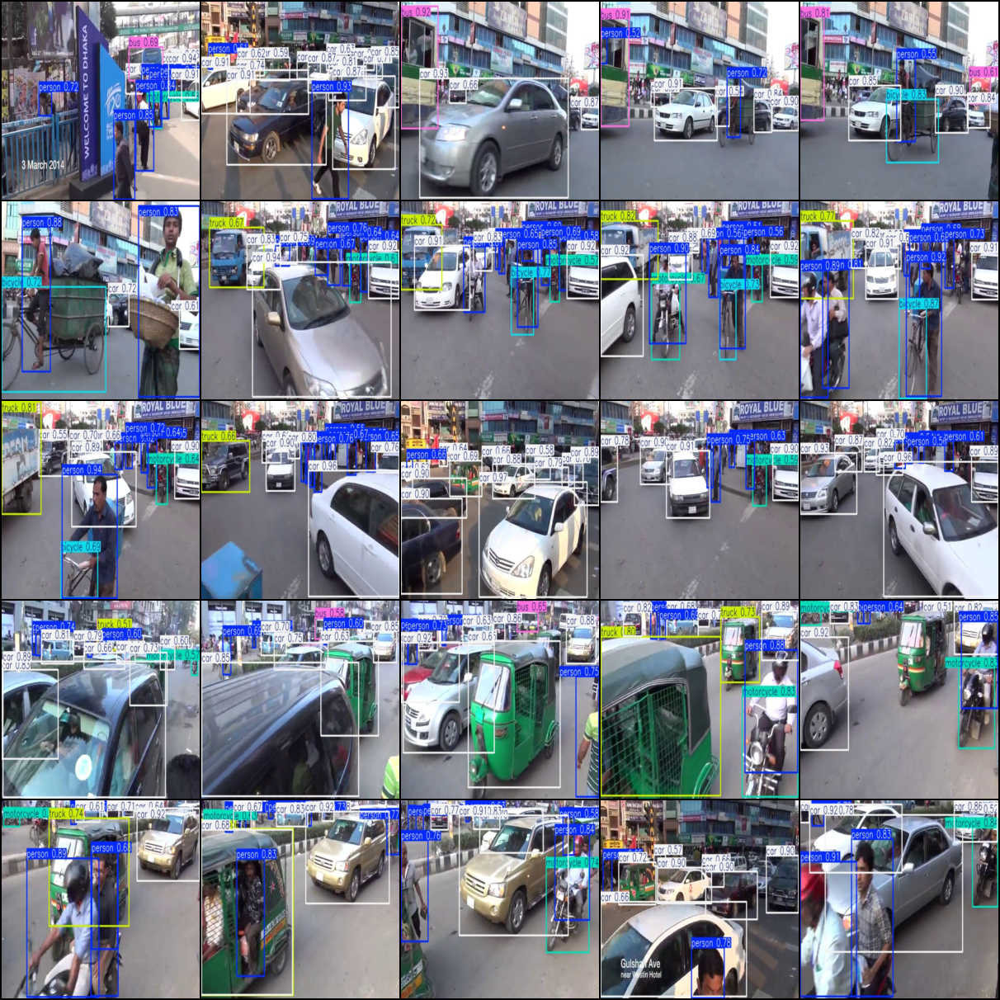

In [70]:
image = display_sample_images(results[0].save_dir, sample=25)
image

In [71]:
image_task = display_sample_images(results_task[0].save_dir, sample=10)

In [72]:
video_path = Path("data_video", "dhaka_traffic.mp4")
Video(video_path)

In [80]:
!ffmpeg -ss 00:00:00 -to 00:00:30 -y -i $video_path -c copy data_video/dhaka_traffic_truncated.mp4

'ffmpeg' is not recognized as an internal or external command,
operable program or batch file.


In [83]:
# import ffmpeg
# ffmpeg.input("input.mp4").output("output.mp4").run()


In [84]:
video_truncated_path = Path("data_video", "dhaka_traffic_truncated.mp4")
Video(video_truncated_path, embed=True)

In [85]:
results_video = yolo.predict(
    video_truncated_path,
    conf=0.5,
    save=True,
    stream=True,
    project=Path("runs", "detect"),
    name="video_source",
)

In [86]:
for result in results_video:
    continue

FileNotFoundError: data_video\dhaka_traffic_truncated.mp4 does not exist

In [87]:
!yolo task=detect mode=predict conf=0.5 model=yolov8s.pt source=$video_truncated_path project="runs/detect" name="command_line" > /dev/null

The system cannot find the path specified.


In [88]:
!ffmpeg -y -i runs/detect/command_line/dhaka_traffic_truncated.avi output.mp4

'ffmpeg' is not recognized as an internal or external command,
operable program or batch file.


In [89]:
Video("output.mp4")

ValueError: To embed videos, you must pass embed=True (this may make your notebook files huge)
Consider passing Video(url='...')

In [90]:
!yolo ...

# This will convert your video to mp4 and display it in the notebook
!ffmpeg -y -i runs/detect/command_line_task/dhaka_traffic_truncated_task.avi output_task.mp4
Video("output_task.mp4")

Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\hp\AppData\Roaming\Python\Python311\Scripts\yolo.exe\__main__.py", line 6, in <module>
  File "C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\ultralytics\cfg\__init__.py", line 911, in entrypoint
    check_dict_alignment(full_args_dict, {a: ""})
  File "C:\Users\hp\AppData\Roaming\Python\Python311\site-packages\ultralytics\cfg\__init__.py", line 502, in check_dict_alignment
    raise SyntaxError(string + CLI_HELP_MSG) from e
SyntaxError: '...' is not a valid YOLO argument. 

    Arguments received: ['yolo', '...']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ['obb', 'classify', 'pose', 'segment', 'detect']
                MODE (required) is one of ['benchmark', 'predict', 'track', 'export', 'train', 'val']
                ARGS (optional) a

ValueError: To embed videos, you must pass embed=True (this may make your notebook files huge)
Consider passing Video(url='...')

In [91]:
!yolo task=detect mode=predict conf=0.5 model = yolov8.pt source=$video_truncated_path_task project= "runs/detect" name ="command_line_task" > /dev/null 

# This will convert your video to mp4 and display it in the notebook
!ffmpeg -y -i runs/detect/command_line_task/dhaka_traffic_truncated_task.avi output_task.mp4
Video("output_task.mp4")

The system cannot find the path specified.
'ffmpeg' is not recognized as an internal or external command,
operable program or batch file.


ValueError: To embed videos, you must pass embed=True (this may make your notebook files huge)
Consider passing Video(url='...')